# Tornadoes in the USA, 1954 - 2013

#### Visualizing incidence and fatalities caused by tornadoes in the USA between 1954-2013.
#### The following analyses were performed: 

1. Yearly incidence
2. Incidence per state
3. Magnitude analysis 
4. Injuries and fatalities caused by tornadoes 
5. Geographical distribution of tornadoes

### Data source

- Kaggle 
##### https://www.kaggle.com/datasets/thedevastator/1950-2013-north-america-tornadoes-historical-tra

- Original data in Kaggle obtained from HIFLD and pre-cleaned
##### https://hifld-geoplatform.opendata.arcgis.com/datasets/geoplatform::historical-tornado-tracks-1/explore?location=35.011869%2C-114.214953%2C3.85

##### Note: the data prior to 1954 set was removed due to inconsistencies in the magnitude reporting

#### Variables

- OM: Origin Mode (Point or Line) (String)
- YR: Year (Integer)
- MO: Month (Integer)
- DY: Day (Integer)
- DATE: Date (String)
- TIME: Time (String)
- TZ: Time Zone (String)
- ST: State (String)
- STF: FIPS State Code (String)
- STN: State Name (String)
- MAG: Magnitude (Integer)
- INJ: Injuries (Integer)
- FAT: Fatalities (Integer)
- LOSS: Loss (Integer)
- CLOSS: Crop Loss (Integer)
- SLAT: Starting Latitude (Float)
- SLON: Starting Longitude (Float)
- ELAT: Ending Latitude (Float)
- ELON: Ending Longitude (Float)
- LEN: Length of Track (Float)

In [2]:
# Libraries needed 

import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import numpy as np
import squarify
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

In [3]:
# Note: to download static version of plotly graphs you need to install kaleido: 

# pip install -U kaleido
# or 
# conda install -c conda-forge python-kaleido

In [4]:
# Import the data frame 
df = pd.read_csv('data.csv', index_col=0)

In [5]:
df.head()

,level_0,index,FID,OM,YR,MO,DY,DATE,TIME,TZ,...,LOSS,CLOSS,SLAT,SLON,ELAT,ELON,LEN,WID,Shape_Leng,DATE_TIME
0,14228,14228,15229,1,1954,1,20,1954-01-20,05:30:00,3,...,4.0,0.0,33.30,-88.83,33.47,-88.62,17.3,27,0.270185,1954-01-20 05:30:00
1,14233,14233,15234,2,1954,1,20,1954-01-20,05:45:00,3,...,3.0,0.0,33.38,-88.42,33.45,-88.37,5.6,100,0.086023,1954-01-20 05:45:00
2,40377,40377,40378,3,1954,2,13,1954-02-13,10:30:00,3,...,3.0,0.0,38.13,-105.47,0.00,0.00,0.5,17,0.000143,1954-02-13 10:30:00
3,30104,30104,30105,4,1954,2,15,1954-02-15,20:18:00,3,...,5.0,0.0,35.48,-93.48,0.00,0.00,1.0,100,0.000144,1954-02-15 20:18:00
4,9220,9220,11221,5,1954,2,15,1954-02-15,22:10:00,3,...,0.0,0.0,34.10,-94.15,0.00,0.00,0.1,167,0.000142,1954-02-15 22:10:00


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 56866 entries, 0 to 56865
Data columns (total 26 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   level_0     56866 non-null  int64  
 1   index       56866 non-null  int64  
 2   FID         56866 non-null  int64  
 3   OM          56866 non-null  int64  
 4   YR          56866 non-null  int64  
 5   MO          56866 non-null  int64  
 6   DY          56866 non-null  int64  
 7   DATE        56866 non-null  object 
 8   TIME        56866 non-null  object 
 9   TZ          56866 non-null  int64  
 10  ST          56866 non-null  object 
 11  STF         56866 non-null  int64  
 12  STN         56866 non-null  int64  
 13  MAG         56866 non-null  int64  
 14  INJ         56866 non-null  int64  
 15  FAT         56866 non-null  int64  
 16  LOSS        56866 non-null  float64
 17  CLOSS       56866 non-null  float64
 18  SLAT        56866 non-null  float64
 19  SLON        56866 non-nul

# Data visualizations

## 1. Yearly incidence 

In [7]:
# Group data by year and calculate the number of rows with size() on a MO column 
# Name the resulting column as 'No. of tornadoes'

yearly = df.groupby('YR')[['MO']].size().reset_index(name='No. of tornadoes') 

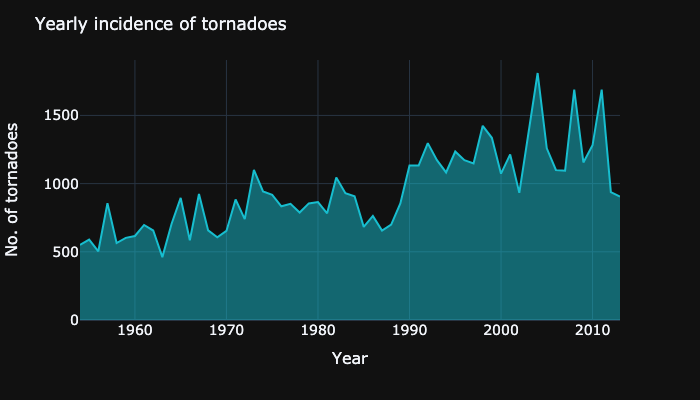

In [8]:
# Plot the grouped dataset as an interactive plot
import plotly.express as px
import plotly.graph_objects as go


fig = go.Figure(data = px.area(yearly, x="YR", y = 'No. of tornadoes',template="plotly_dark",
                width=700, height=400))
                
fig.update_traces(line=dict(color="#17BECF", width=2)) # specify line color in the plot
    
fig.update_layout(
        title = 'Yearly incidence of tornadoes',
        xaxis_title="Year", yaxis_title='No. of tornadoes',
        xaxis=dict(title_font=dict(size=16), tickfont=dict(size=14)),
        yaxis=dict(title_font=dict(size=16), tickfont=dict(size=14))
)

fig.show('png')

# Specify connfigurations for exporting a static image 
config = {
    'format': 'png',
    'engine': 'kaleido',
    'scale': 3,
}
# Export the image 
fig.write_image('Yearly.png', **config)

## 2. State-specific incidence 

In [9]:
# Group data by state and measure how many each state occurs in the dataset by value_counts() function
# Sort on ST_INC column for plotting purposes 

state_inc =df.groupby('ST')[['ST']].value_counts().reset_index(name='ST_INC').sort_values(by = 'ST_INC', ascending = False)
state_inc

,ST,ST_INC
42,TX,8117
14,KS,3709
34,OK,3392
8,FL,3129
27,NE,2607
10,IA,2253
12,IL,2211
22,MO,2033
4,CO,1941
23,MS,1899


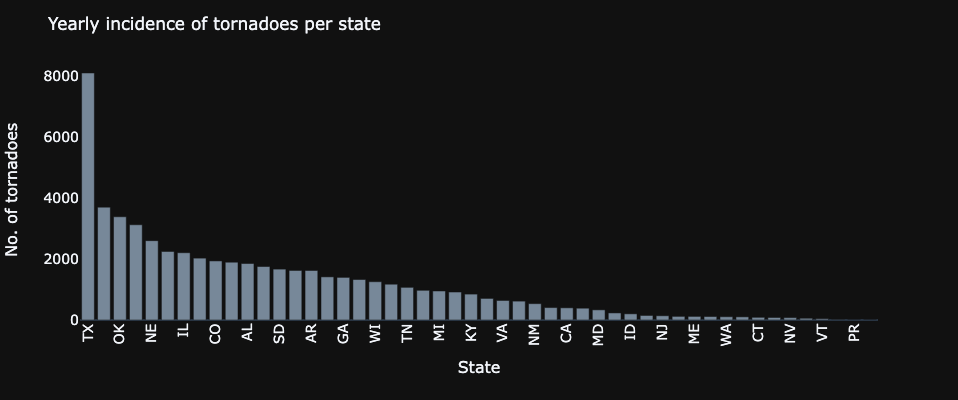

In [10]:
import plotly.express as px
import plotly.graph_objects as go


colors = ['lightslategray',] * 50 

fig = go.Figure(px.bar(x=state_inc.ST, y=state_inc.ST_INC))


fig.update_layout(title = 'Yearly incidence of tornadoes per state',
                 template='plotly_dark', width=1100, height=400,
                 xaxis_title="State", yaxis_title="No. of tornadoes",
                 xaxis_tickangle=-90)

fig.update_layout(xaxis=dict(title_font=dict(size=16), tickfont=dict(size=14)),
                  yaxis=dict(title_font=dict(size=16), tickfont=dict(size=14), showgrid=False))

fig.update_traces(marker_color=colors)

fig.show()



# Exporting a static version of this figure 
config = {
    'format': 'png',
    'engine': 'kaleido',
    'scale': 3,
}

fig.write_image('State_inc.png', **config)


## 3. Magnitude analysis 

In [11]:
# Group data on magnitude column 'MAG'

mag_counts = df['MAG'].value_counts().reset_index()
mag_counts.columns = ['MAG', 'Counts'] 
mag_counts.set_index('MAG', inplace = True)

In [12]:
# add a new column with normalized values of Counts 

mag_counts['Normalized'] = mag_counts.apply(lambda col: ((col['Counts'] / mag_counts.Counts.sum())*100).round(2), axis=1)

mag_counts

,Counts,Normalized
MAG,,
0,26550,46.69
1,19076,33.55
2,8427,14.82
3,2252,3.96
4,507,0.89
5,54,0.09


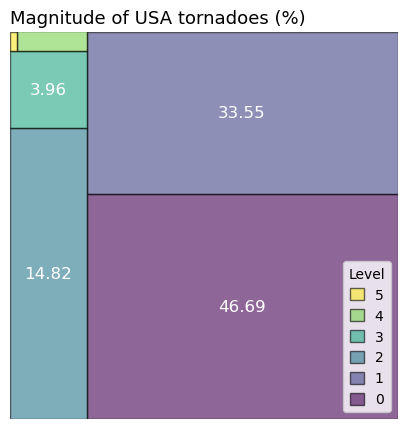

In [13]:
# Plot a treemap to represent a relative distribution of tornado magnitude over all 60 years 
import numpy as np
import squarify
import matplotlib.pyplot as plt
from matplotlib.patches import Patch


fig, ax = plt.subplots(figsize=(5, 7))

labels = [i for i in mag_counts.index]
num_labels_in_legend = 6


ax = squarify.plot(
    sizes=mag_counts['Counts'],
    label=[i for i in mag_counts['Normalized'] if i > 1], # to only display labels with values of > 1% 
    color=plt.cm.viridis(np.linspace(0, 1, len(mag_counts.index))), 
    alpha=0.6,
    ec='black',
    text_kwargs={'color': 'white', 'size': 12}
)

# Add legend 
plt.legend(handles=ax.containers[0][:-num_labels_in_legend - 1:-1], 
           labels=labels[:-num_labels_in_legend - 1:-1],
           handlelength=1, handleheight=1, loc = 'lower right', title = 'Level')
ax.axis('off')
ax.invert_xaxis()
ax.set_aspect('equal')
ax.set_title('Magnitude of USA tornadoes (%)',loc = 'left', fontsize = 13)

plt.show()


# Export the image at 300 dpi
fig.savefig('Mag_treemap.png', dpi=300)

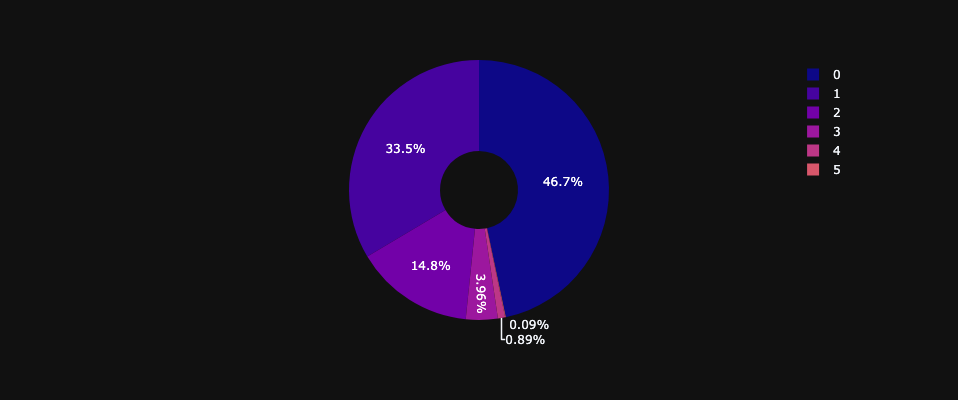

In [14]:
# Pie plot for the dashbord showing the same as above 

fig = px.pie(mag_counts, values='Normalized', names=mag_counts.index, hole=.3, 
             template="plotly_dark", width=700, height=400, 
             color_discrete_sequence= px.colors.sequential.Plasma)

fig.show()

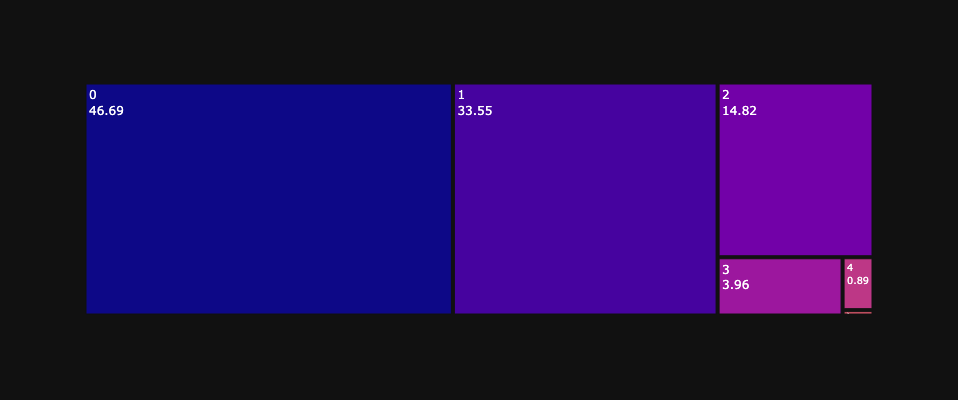

In [15]:
# An alternative interactive treemap plot  

fig = px.treemap(mag_counts, path=[mag_counts.index], values='Normalized', 
                 template="plotly_dark", width=700, height=400, 
                 color_discrete_sequence= px.colors.sequential.Plasma, hover_data=['Normalized'])

fig.update_layout(legend_title='Category', legend_orientation='h')
fig.update_traces(textinfo='label+value')


fig.show()

## 4. Injuries and fatalities caused by tornadoes

In [16]:
# Analyse contibution of each magnitude of tornado towards injury incidence 

inj =df.groupby('MAG')[['INJ']].sum()

total = inj.sum().sum()  # Calculate the total sum of all columns

inj_perc = (inj / total) * 100 
inj_perc

,INJ
MAG,
0,0.895416
1,7.765028
2,17.269754
3,25.254771
4,35.469410
5,13.345621


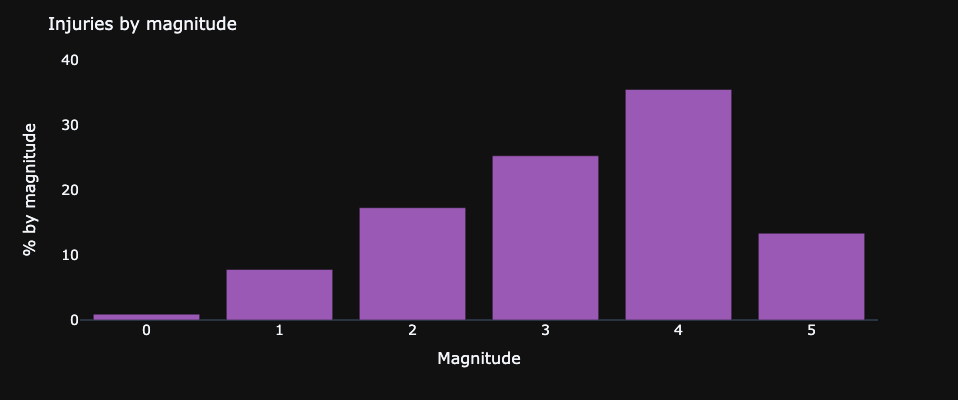

In [17]:
import plotly.express as px
import plotly.graph_objects as go


colors = ['#9B59B6',] * 6

fig = go.Figure(px.bar(x=inj_perc.index, y=inj_perc.INJ))


fig.update_layout(title = 'Injuries by magnitude',
                 template='plotly_dark', width=600, height=400,
                 xaxis_title="Magnitude", yaxis_title="% by magnitude",
                 )

fig.update_layout(xaxis=dict(title_font=dict(size=16), tickfont=dict(size=14)),
                  yaxis=dict(title_font=dict(size=16), tickfont=dict(size=14), showgrid=False, range=[0, 40]))

fig.update_traces(marker_color=colors)


fig.show()



# Exporting a static image 
config = {
    'format': 'png',
    'engine': 'kaleido',
    'scale': 3,
}

fig.write_image('Inj_per_mag.png', **config)

In [18]:
# Analyse contibution of each magnitude of tornado towards fatality incidence 

fat =df.groupby('MAG')[['FAT']].sum()

total = fat.sum().sum()  # Calculate the total sum of all columns

fat_perc = (fat / total) * 100 
fat_perc

,FAT
MAG,
0,0.450174
1,4.419890
2,10.354000
3,24.268467
4,38.489871
5,22.017598


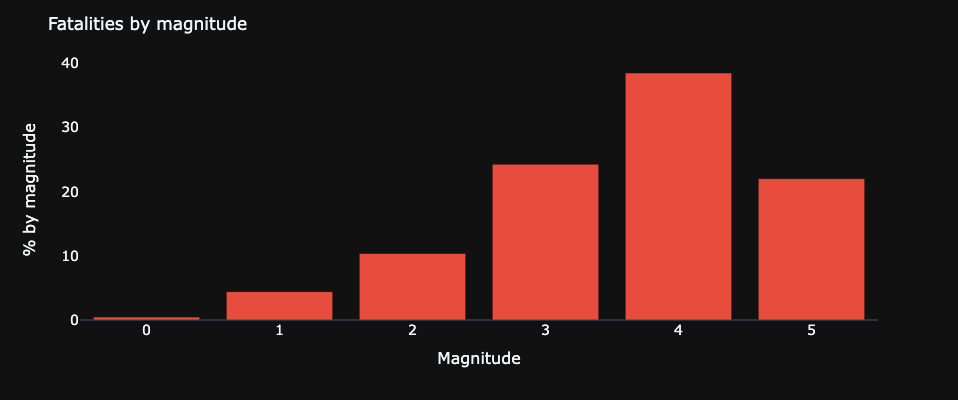

In [19]:
import plotly.express as px
import plotly.graph_objects as go


colors = ['#E74C3C',] * 6

fig = go.Figure(px.bar(x=fat_perc.index, y=fat_perc.FAT))


fig.update_layout(title = 'Fatalities by magnitude',
                 template='plotly_dark', width=600, height=400,
                 xaxis_title="Magnitude", yaxis_title="% by magnitude")

fig.update_layout(xaxis=dict(title_font=dict(size=16), tickfont=dict(size=14)),
                  yaxis=dict(title_font=dict(size=16), tickfont=dict(size=14), showgrid=False))

fig.update_traces(marker_color=colors)



# Show the plot
fig.show()


config = {
    'format': 'png',
    'engine': 'kaleido',
    'scale': 3,
}

# Export the plot as a TIFF file with transparency
fig.write_image('Fat_per_mag.png', **config)


In [20]:
# Analyse yearly incidence of injuries and fatalities 

fat_inj = df.groupby('YR')[['INJ', 'FAT']].sum()
fat_inj

,INJ,FAT
YR,,
1954,715,36
1955,926,129
1956,1308,81
1957,1976,192
1958,535,67
1959,734,58
1960,737,46
1961,1087,52
1962,551,30


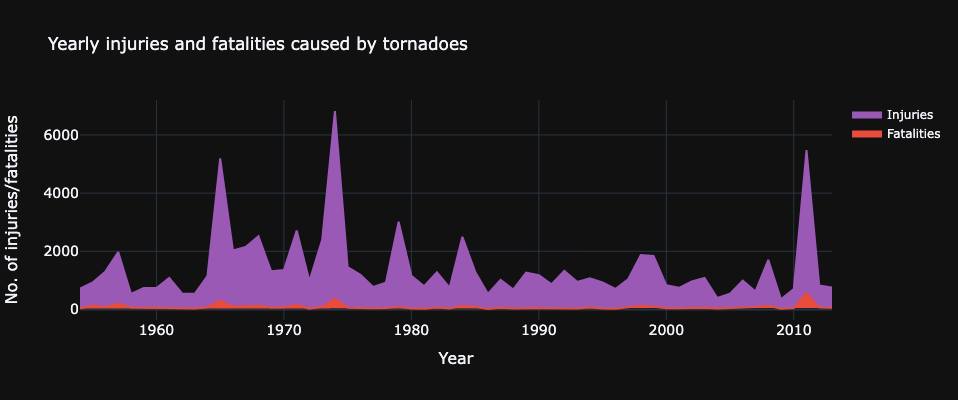

In [21]:
import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(go.Scatter(x=fat_inj.index, y=fat_inj['FAT'], fill='toself', name = 'Fatalities', 
                         fillcolor = "#e74c3c", line=dict(color='#e74c3c', width=2))) 
fig.add_trace(go.Scatter(x=fat_inj.index, y=fat_inj['INJ'], fill='tonexty', name = 'Injuries', 
                         fillcolor = "#9b59b6", line=dict(color='#9b59b6', width=2)))

fig.update_layout(title = 'Yearly injuries and fatalities caused by tornadoes', 
                  template='plotly_dark', width=600, height=400,
                 xaxis_title="Year", yaxis_title="No. of injuries/fatalities",
                 xaxis=dict(title_font=dict(size=16), tickfont=dict(size=14)),
                  yaxis=dict(title_font=dict(size=16), tickfont=dict(size=14)))

fig.show()


# Exporting a static image 
config = {
    'format': 'png',
    'engine': 'kaleido',
    'scale': 3,
}

fig.write_image('Yearly_injuries_fatalities.png', **config)

## 5. Geographical distribution of tornadoes

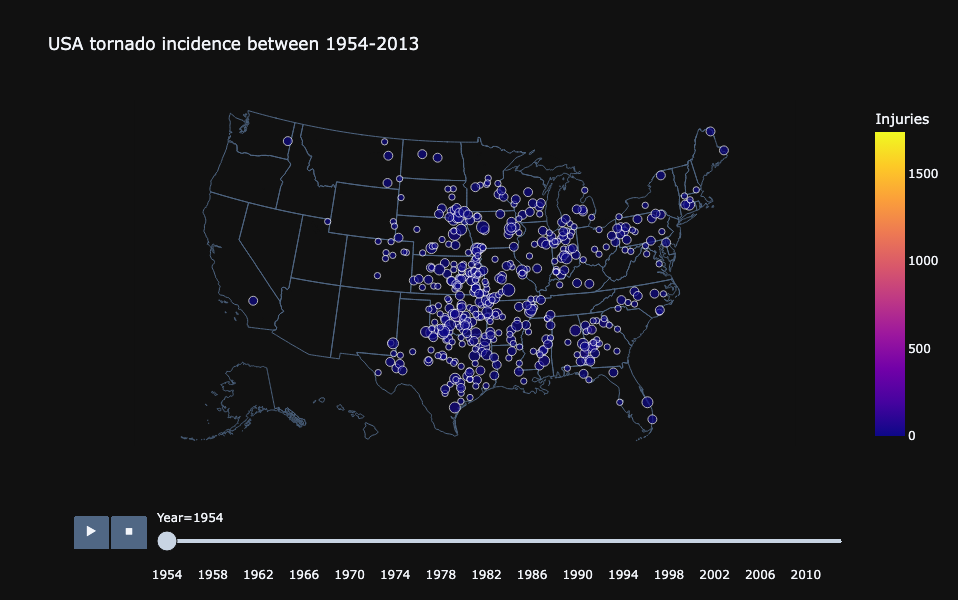

In [22]:
# Plotting location of each tornado event using longitude and latitude data 
# The size of a bubble represents magnitude and color represents injuries caused by the tornadoes

import plotly.graph_objects as go
import plotly.express as px 

fig = go.Figure(data= px.scatter_geo(df,
                    lat="SLAT",
                    lon="SLON",
                    title="Meteorite Landings",
                    template="plotly_dark",
                    size = "MAG",
                    size_max = 10,
                    color="INJ",
                    animation_frame='YR',
                    width=800, 
                    height=600,
                    range_color=[df['INJ'].min(), df['INJ'].max()],
                    labels={'MAG':'Magnitude',
                            'FAT': 'Fatalities', 
                            'YR': 'Year',
                            'INJ':'Injuries'
                           },
                    hover_name = df['ST'].astype(str)
                    ))

fig.update_layout(title = 'USA tornado incidence between 1954-2013',
                  geo_scope='usa',
                  showlegend = True)

fig.update_geos(visible=True, resolution=50)

fig.show()




# Figure export as a static image 
config = {
    'format': 'png',
    'engine': 'kaleido',
    'scale': 3,
}

fig.write_image('Map.png', **config)